# 📷 Session 3: The AI Field Ecologist
**Objective:** Automate detection and identification of terrestrial animals from camera-trap images.


**Tools:**
1.  **[MegaDetector](https://megadetector.readthedocs.io/):** A model trained on millions of camera trap images to find "Animals" (bounding boxes).
  - MegaDetector is "dumb"—it only knows "Animal" or "Human". It doesn't know species.
2.  **[BioCLIP](https://imageomics.github.io/bioclip/):** A foundation model that knows the taxonomy of 450,000 species. It looks at the box and says "That's a *Procavia capensis*".
  - BioCLIP is smart, but slow. We only run it on the small cropped boxes (efficiency).


## Libraries
Make sure the libraries are installed in the current Python environment.

In [13]:
%matplotlib inline
import matplotlib.pyplot as plt
import os, shutil
from io import BytesIO
import json
import urllib.request
from urllib.parse import quote
from concurrent.futures import ThreadPoolExecutor
from PIL import Image

import torch
import open_clip
from megadetector.detection import run_detector


## Setup Device
We can use CUDA if there is a GPU; MPS if this is an Apple-silicon MacOS; or otherwise CPU.

In [5]:
device = "mps" if torch.backends.mps.is_available() else ("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: mps


## Data: Snapshot Safari 2024 Expansion
The [Snapshot Safari 2024 Expansion](https://lila.science/datasets/snapshot-safari-2024-expansion/) dataset:
> This dataset contains 4,029,374 images from 15 camera trapping projects in the the Snapshot Safari program. Short descriptions of individual projects are provided below, in the project descriptions section.
> Labels are provided for 151 categories. The most common labels are “empty” (2,739,081 instances), “impala” (231,564 instances), and “zebra” (122,067 instances). Animal counts are provided for 1,322,468 of the category labels.
> There are 1824 unique location IDs in the dataset, each representing a camera.

Let's see a single image first.

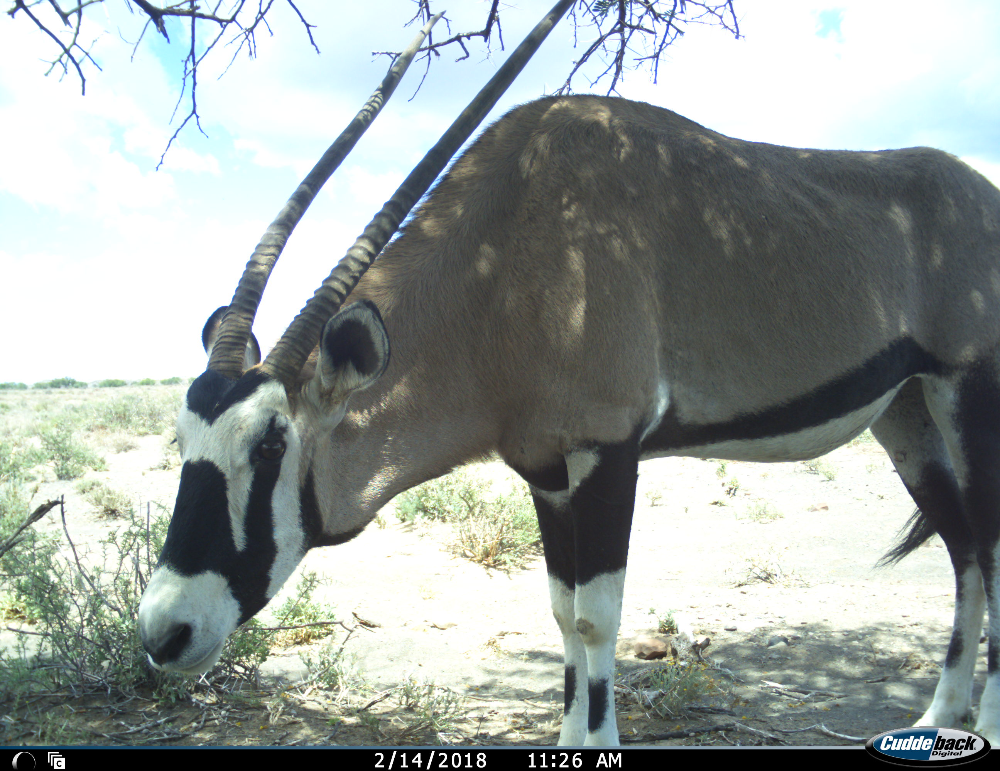

In [6]:
image_url = "https://storage.googleapis.com/public-datasets-lila/snapshot-safari-2024-expansion/KAR/KAR_S2/C01/C01_R2/KAR_S2_C01_R2_IMAG0210.JPG"

with urllib.request.urlopen(image_url) as response:
    image = Image.open(BytesIO(response.read())).convert('RGB')
image

**Why start with a single image?**
A single example lets us inspect the output format and sanity-check detections before scaling to a folder.


## Detecting animals with MegaDetector
[MegaDetector](https://megadetector.readthedocs.io/) is an object detector trained on **camera-trap images** that returns bounding boxes with coarse classes like animal/human/vehicle. We use it as a fast filter before species classification.

In [7]:
detector = run_detector.load_detector('MDV5A')

Model v5a.0.1 already exists and is valid at /var/folders/vc/qm7741c57dsg9f7wyrtrdrrm0000gq/T/megadetector_models/md_v5a.0.1.pt
PyTorch reports 0 available CUDA devices
PyTorch reports Metal Performance Shaders are available
GPU available: True


/Users/yoavram/Work/Teaching/AniML/.pixi/envs/default/lib/python3.12/site-packages/yolov5/utils/general.py:31: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg


Loading PT detector with compatibility mode classic
Loaded image size 1280 from model metadata
Using model stride: 64
Using MPS device
PTDetector using device mps


Fusing layers... 
Fusing layers... 
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs


In [8]:
results = detector.generate_detections_one_image(image)
detections = [detect for detect in results['detections'] if detect['conf'] > 0.2]
print(f"🔎 Found {len(detections)} animals.")

🔎 Found 1 animals.


Confidence threshold: lower thresholds find more animals but add false positives (precision-recall balance).

**Try**: 0.2, 0.5, and 0.9 and compare misses.

Now we draw the bounding boxes found by MegaDetector.
Drawing boxes helps spot obvious failures (e.g., partial animals, shadows). In real workflows you would also save detections to JSON for later analysis.


In [10]:
fig, ax = plt.subplots(figsize=(6, 4))
ax.imshow(image)
ax.axis('off')
ax.set_title(f"Detected {len(detections)} animals")
width, height = image.size
for det in detections:
    x, y, w, h = det['bbox']  # [x_min, y_min, width, height]
    x1, y1 = x * width, y * height
    rect = plt.Rectangle(
        (x1, y1), w * width, h * height,
        linewidth=3, edgecolor='red', facecolor='none'
    )
    ax.add_patch(rect)
plt.tight_layout()

# Classifying animals with BioCLIP
We will use BioCLIP to identify species *without* training it.
BioCLIP is a vision foundation model trained on TreeOfLife-10M with taxonomic labels, designed for broad biological classification. It supports zero-shot species ID when given scientific names as text prompts. See the [BioCLIP paper](https://arxiv.org/abs/2311.18803v3) and [project page](https://imageomics.github.io/bioclip/).

The pipeline is: (1) MegaDetector → (2) crop animal → (3) BioCLIP zero-shot classification.

We will use a subset of the dataset, 100 images with 10 images per species for common species in the dataset. 
The metadata is in `snapshot_safari_top10_subset.json` and we need to download the images.

In [12]:
print("Loading metadata...")
with open('snapshot_safari_top10_subset.json', 'r') as f:
    metadata = json.load(f)

def get_true_species(image_url, metadata):
    """Extract the true species from metadata for a given image URL"""
    # Parse the image path from URL
    # e.g., "KAR/KAR_S2/C01/C01_R2/KAR_S2_C01_R2_IMAG0210.JPG"
    image_key = "/".join(image_url.split("/")[-5:])
    
    # Search through metadata
    for entry in metadata.get('images', []):
        if entry.get('file_name', '').endswith(os.path.basename(image_url)):
            # Get annotations for this image
            image_id = entry.get('id')
            for ann in metadata.get('annotations', []):
                if ann.get('image_id') == image_id:
                    # Get category name
                    category_id = ann.get('category_id')
                    for cat in metadata.get('categories', []):
                        if cat.get('id') == category_id:
                            return cat.get('name', 'Unknown')
    return 'Unknown'

print(f"Loaded metadata with {len(metadata.get('images', []))} images")

Loading metadata...
Loaded metadata with 100 images


Now download the images.
For larger datasets, cache downloaded images and process in batches to avoid repeated network calls and to keep memory use stable.

In [14]:
# Extract sample URLs from metadata
base_url = "https://storage.googleapis.com/public-datasets-lila/snapshot-safari-2024-expansion/"
image_dir = "karoo_sample"

# Build list of image URLs from metadata
sample_urls = []
for img_entry in metadata.get('images', []):
    file_name = img_entry.get('file_name', '')
    if file_name:
        # URL-encode the filename to handle spaces and special characters
        encoded_path = quote(file_name)
        sample_urls.append(base_url + encoded_path)

print(f"Found {len(sample_urls)} images in metadata")

Found 100 images in metadata


In [ ]:
# Download the sample images
# shutil.rmtree(image_dir) # remove existing directory
if not os.path.exists(image_dir):
    os.makedirs(image_dir, exist_ok=True)

print(f"⬇Downloading {len(sample_urls)} images into {image_dir}...")

def download_image(url):
    filename = os.path.join(image_dir, os.path.basename(url))
    urllib.request.urlretrieve(url, filename)
    return filename

with ThreadPoolExecutor() as executor:
    sample_paths = list(executor.map(download_image, sample_urls))

print(sample_paths)


⬇Downloading 100 images into karoo_sample...
['karoo_sample/APN_S3_DW_R11_IMAG0680.JPG', 'karoo_sample/APN_S3_DW_R8_IMAG0578.JPG', 'karoo_sample/APN_S3_JJ6_R12_IMAG0166.JPG', 'karoo_sample/APN_S3_K034_R10_IMAG0224.JPG', 'karoo_sample/APN_S3_U23a_R8_IMAG0072.JPG', 'karoo_sample/APN_S3_U63c_R11_IMAG0436.JPG', 'karoo_sample/APN_S4_DW_R13_IMAG0161.JPG', 'karoo_sample/BLO_S1_C03_R1_IMAG1028.JPG', 'karoo_sample/CDB_S1_E05_R1_IMAG0157.JPG', 'karoo_sample/DEB_S1_D7_R53_IMAG0437.JPG', 'karoo_sample/DEB_S1_D7_R58_IMAG0537.JPG', 'karoo_sample/DEB_S1_F9_R52_IMAG0393.JPG', 'karoo_sample/DEB_S1_H8_R77_IMAG0115.JPG', 'karoo_sample/EFA_S1_EFA06_R3_IMAG0360.JPG', 'karoo_sample/EFA_S1_EFA07_R1_IMAG1121.JPG', 'karoo_sample/EFA_S1_EFA07_R1_IMAG1224.JPG', 'karoo_sample/EFA_S1_EFA07_R21_IMAG1705.JPG', 'karoo_sample/EFA_S1_EFA07_R23_IMAG0563.JPG', 'karoo_sample/EFA_S1_EFA08_R28_IMAG0856.JPG', 'karoo_sample/ENO_S3_D01_R1_IMAG0258.JPG', 'karoo_sample/ENO_S5_E06_R2_IMAG0183.JPG', 'karoo_sample/KAR_S1_E02_R1_IMA

Now we load BioCLIP. 

The first load downloads weights from the Hugging Face hub. This can take a few minutes, especially on CPU.


In [16]:
# Load BioCLIP - first time takes several minutes
print("Loading BioCLIP...")
bioclip_model, _, preprocess = open_clip.create_model_and_transforms(
    'hf-hub:imageomics/bioclip', precision='fp16' # use "half precision" (fp16) for speed
)
tokenizer = open_clip.get_tokenizer('hf-hub:imageomics/bioclip')
bioclip_model.to(device);


Parsing model identifier. Schema: hf-hub, Identifier: imageomics/bioclip
Parsing model identifier. Schema: hf-hub, Identifier: imageomics/bioclip
Attempting to load config from HF Hub: imageomics/bioclip
Attempting to load config from HF Hub: imageomics/bioclip


Loading BioCLIP...


HTTP Request: HEAD https://huggingface.co/imageomics/bioclip/resolve/main/open_clip_config.json "HTTP/1.1 307 Temporary Redirect"
HTTP Request: HEAD https://huggingface.co/imageomics/bioclip/resolve/main/open_clip_config.json "HTTP/1.1 307 Temporary Redirect"
HTTP Request: HEAD https://huggingface.co/api/resolve-cache/models/imageomics/bioclip/90bfce36c3fc275e9c66afd015e6b4f37e1084f6/open_clip_config.json "HTTP/1.1 200 OK"
HTTP Request: HEAD https://huggingface.co/api/resolve-cache/models/imageomics/bioclip/90bfce36c3fc275e9c66afd015e6b4f37e1084f6/open_clip_config.json "HTTP/1.1 200 OK"
Loaded model config from HF Hub: imageomics/bioclip
Loaded model config from HF Hub: imageomics/bioclip
HTTP Request: HEAD https://huggingface.co/imageomics/bioclip/resolve/main/open_clip_model.safetensors "HTTP/1.1 404 Not Found"
HTTP Request: HEAD https://huggingface.co/imageomics/bioclip/resolve/main/open_clip_model.safetensors "HTTP/1.1 404 Not Found"
HTTP Request: HEAD https://huggingface.co/imageo

### Taxonomy as prompts.
BioCLIP is trained with hierarchical taxonomy, so binomial scientific names are usually better prompts than common names. 
The paper discusses why this helps generalization across the tree of life ([BioCLIP paper](https://arxiv.org/abs/2311.18803v3)).


In [26]:
common_to_scientific = {
    # 'empty': 'empty',
    'impala': 'Aepyceros melampus',
    'zebraplains': 'Equus quagga',
    'wildebeestblue': 'Connochaetes taurinus',
    'elephant': 'Loxodonta africana',
    'baboon': 'Papio ursinus',
    'oryx': 'Oryx gazella',
    'kudu': 'Tragelaphus strepsiceros',
    'gazellethomsons': 'Eudorcas thomsonii',
    'vulture': 'Gyps africanus'
}
scientific_to_common = {v: k for k, v in common_to_scientific.items()}

# Zero-shot taxonomy setup - extract from metadata
common_names = [cat['name'] for cat in metadata.get('categories', [])]
taxonomy = [common_to_scientific.get(name, name) for name in common_names]
print(f"Taxonomy ({len(taxonomy)} species): {taxonomy}")

# BioCLIP works best with just the binomial name
with torch.no_grad():
    text_tokens = tokenizer(taxonomy).to(device)
    text_features = bioclip_model.encode_text(text_tokens)
    text_features = text_features / text_features.norm(dim=-1, keepdim=True)

Taxonomy (10 species): ['empty', 'Aepyceros melampus', 'Equus quagga', 'Connochaetes taurinus', 'Loxodonta africana', 'Papio ursinus', 'Oryx gazella', 'Tragelaphus strepsiceros', 'Eudorcas thomsonii', 'Gyps africanus']


Cropping animals before classification reduces background bias and speeds up inference. Recent camera-trap studies show that combining MegaDetector with downstream classifiers improves robustness across locations ([Vyskočil & Picek 2024](https://arxiv.org/abs/2410.12769v1)).


In [27]:
DETECTOR_MIN_CONF = 0.9

def detect_and_classify(image_path):
    image = Image.open(image_path).convert('RGB')
    results = detector.generate_detections_one_image(image)
    all_animal_detections = [
        d for d in results['detections']
        if str(d.get('category')) == '1'
    ]
    
    # Get max confidence for reporting, even if below threshold
    max_det_conf = max([d.get('conf', 0) for d in all_animal_detections]) if all_animal_detections else 0.0
    
    detections = [
        d for d in all_animal_detections
        if d.get('conf', 0) > DETECTOR_MIN_CONF
    ]
    if not detections:
        return image, None, None, float(max_det_conf)

    # Use the top-confidence animal detection
    det = max(detections, key=lambda d: d['conf'])
    detector_conf = float(det['conf'])
    x, y, w, h = det['bbox']
    width, height = image.size
    x1, y1 = int(x * width), int(y * height)
    x2, y2 = x1 + int(w * width), y1 + int(h * height)
    crop = image.crop((x1, y1, x2, y2))

    # BioCLIP zero-shot
    with torch.no_grad():
        image_input = preprocess(crop).unsqueeze(0).to(device).half() # convert image half precision to match model
        image_features = bioclip_model.encode_image(image_input)
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
        logits = (image_features @ text_features.T).squeeze(0)
        probs = logits.softmax(dim=-1)
        top_idx = int(probs.argmax().item())
        pred_species = taxonomy[top_idx]
        bioclip_conf = float(probs[top_idx].item())

    bbox = (x1, y1, x2, y2)
    return image, (pred_species, detector_conf, bioclip_conf), bbox, float(max_det_conf)

We now run the pipeline on the first 20 images and plot the results.

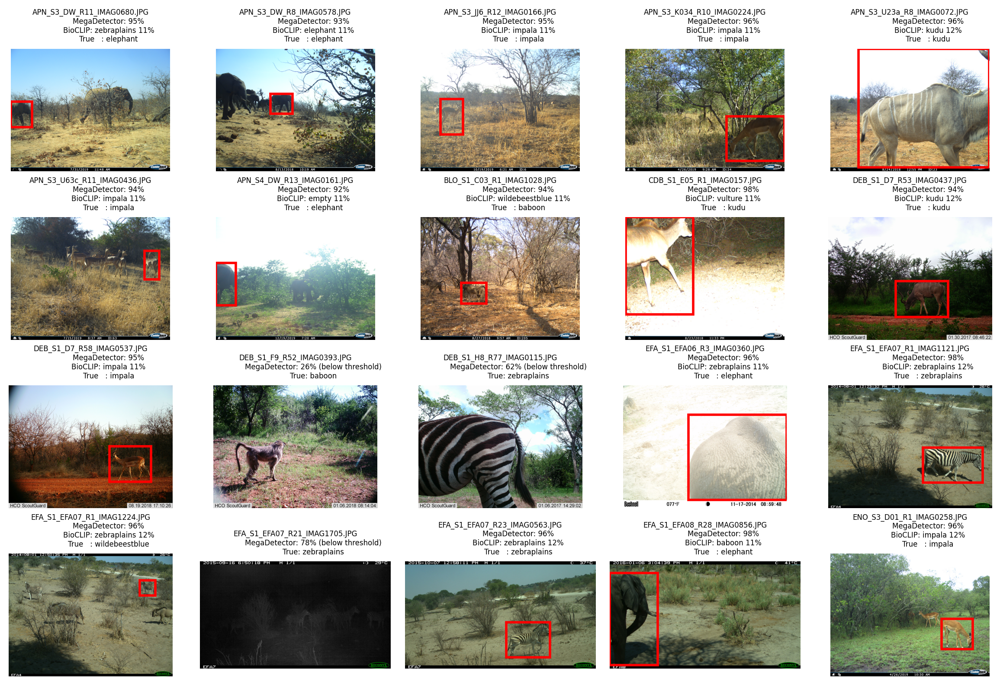

In [28]:
plt.figure(figsize=(12, 8))
num_to_plot = min(20, len(sample_paths))
for i, img_path in enumerate(sample_paths[:num_to_plot]):
    img, pred, bbox, max_det_conf = detect_and_classify(img_path)
    ax = plt.subplot(4, 5, i + 1)
    ax.imshow(img)
    file_name = os.path.basename(img_path)
    ax.axis('off')
    if pred is None:
        true_species = get_true_species(sample_urls[i], metadata)
        ax.set_title(f"""{file_name}
                MegaDetector: {max_det_conf:.0%} (below threshold)
                True: {true_species}""", fontdict={'fontsize': 6})
    else:
        x1, y1, x2, y2 = bbox
        rect = plt.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            linewidth=2, edgecolor='red', facecolor='none'
        )
        ax.add_patch(rect)
        pred_species, detector_conf, bioclip_conf = pred
        pred_species = scientific_to_common.get(pred_species, pred_species)
        true_species = get_true_species(sample_urls[i], metadata)
        ax.set_title(f"""{file_name}
                MegaDetector: {detector_conf:.0%}
                BioCLIP: {pred_species} {bioclip_conf:.0%}
                True   : {true_species}""", fontdict={'fontsize': 6})
plt.tight_layout()

## How to improve results?
- **Calibrate thresholds:** Use a small validation set to pick MegaDetector confidence cutoffs that balance missed animals vs false positives ([MegaDetector docs](https://megadetector.readthedocs.io/)).
- **Handle multiple animals:** Classify each detection (not just the top one) and summarize per-image results; this is common in camera-trap workflows ([MegaDetector docs](https://megadetector.readthedocs.io/)).
- **Background reduction:** Try masking or tighter crops; background removal plus multi-stage classifiers can reduce location bias ([Vyskočil & Picek 2024](https://arxiv.org/abs/2410.12769v1)). A good background removal model is [Segment Anything](https://ai.meta.com/sam3/).
- **Hierarchical evaluation:** Score predictions at genus/family levels to reflect taxonomic structure learned by BioCLIP ([BioCLIP paper](https://arxiv.org/abs/2311.18803v3)).
- **Compare platforms:** For context, see how MegaDetector is used alongside other tools in applied studies ([Velez et al. 2022](https://arxiv.org/abs/2202.02283v1)).

## Further reading 
- BioCLIP project page: https://imageomics.github.io/bioclip/
- MegaDetector documentation: https://megadetector.readthedocs.io/
- BioCLIP paper (CVPR 2024): https://arxiv.org/abs/2311.18803v3
- MegaDetector in camera-trap workflows: https://arxiv.org/abs/2202.02283v1
- Zero-shot camera-trap pipeline study: https://arxiv.org/abs/2410.12769v1
